In [198]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
#import plotly as plt
from sklearn.cluster import KMeans
import seaborn as sns


In [2]:
df = pd.read_csv("DatasetClientClustering.csv", encoding='latin-1')
df = df.drop(df.columns[list(np.arange(9))], axis=1)

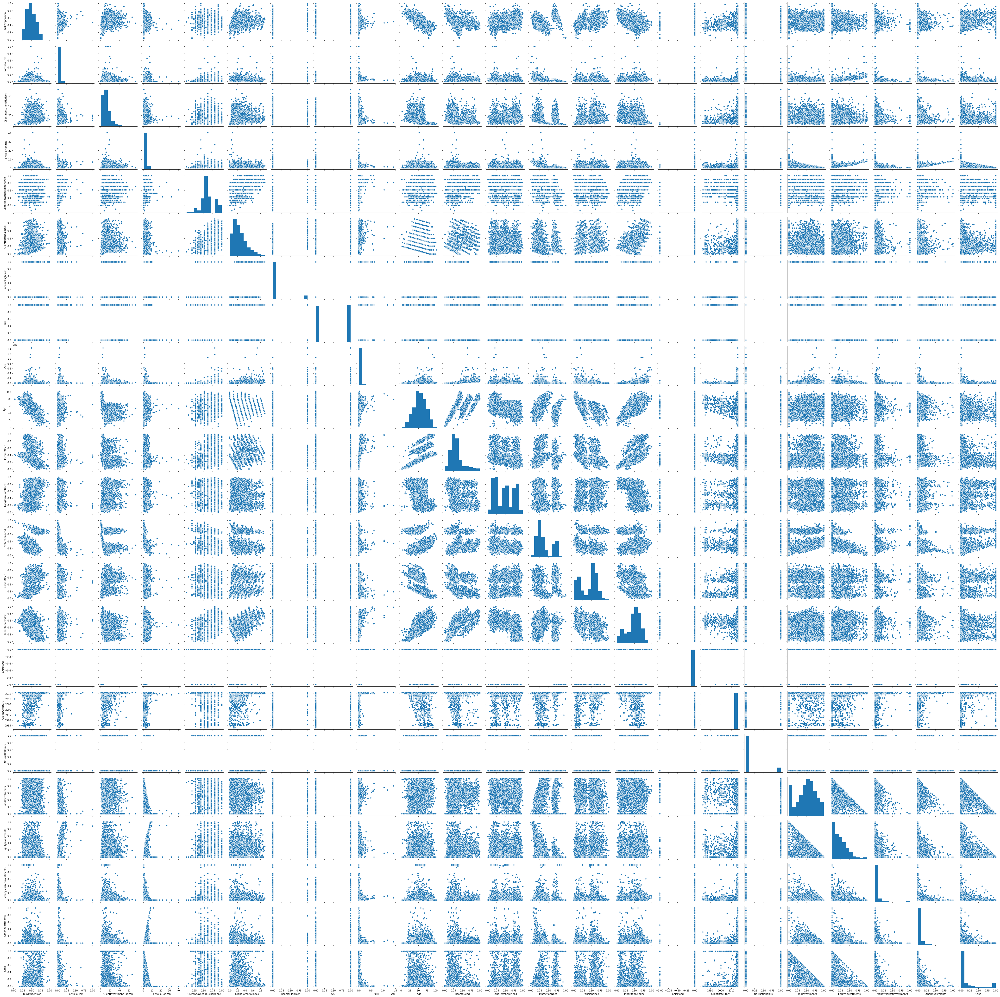

In [202]:
sns.pairplot(df)

### Suddivisione delle variabili: 

1. **Socio-Demografiche** 
    - `Sex`
    - `Age` 
    - `Prov`

2. **DNA finanziario**
    - `RiskPropension`
    - `PortfolioRisk`
    - `ClientInvestmentHorizon`
    - `ClientKnowledgeExperience`
    - `IncomeHighLow`
    - `Asset under Management` (?)
    - `ClientDateStart`

3. **Dati comportamentali**
    - `PanicMood`
    - `NoTrustInBanks`
    
4. **Dati sugli investimenti effettuati**
    - `BondInvestment`
    - `Asset under Management` (?)
    - `EquityInvestment`
    - `MoneyMarketInvestment`
    - `OtherInvestment`
    - `Cash`

### Esplorazione 

**Socio-Demografiche**

In [80]:
socio_demo = ["Sex","Age","Prov"]
df_socio_demo = df[socio_demo]
df_socio_demo

,Sex,Age,Prov
0,1,22,PA
1,1,61,RM
2,0,24,BS
3,0,46,RE
4,0,57,MI
...,...,...,...
4995,0,52,CO
4996,1,45,FI
4997,1,43,PU
4998,0,65,SA


In [84]:
df_socio_demo["Age"].describe()

count    5000.000000
mean       54.575400
std        17.574325
min         2.000000
25%        43.000000
50%        54.000000
75%        68.000000
max       103.000000
Name: Age, dtype: float64

In [88]:
fig_age = px.histogram(df["Age"],nbins=20)
fig_age.show()

In [3]:
fig = px.histogram(df, x="Sex",color="Sex")
fig.show()

*1: Uomo, 0: Donna*

**Dati sugli investimenti effettuati** 


In [111]:
dati_sugli_investimenti_effettuati = ["BondInvestments", "EquityInvestments", "MoneyMarketInvestments","OtherInvestments","Cash","AuM"]
df_invest = df[dati_sugli_investimenti_effettuati]

In [112]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [113]:
df_invest.describe()

,BondInvestments,EquityInvestments,MoneyMarketInvestments,OtherInvestments,Cash,AuM
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5.000000e+03
mean,0.498821,0.230302,0.047452,0.040530,0.174540,1.898872e+05
std,0.274451,0.198136,0.094192,0.087306,0.303692,5.234644e+05
min,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000e+04
25%,0.329475,0.066875,0.000000,0.000000,0.001500,2.773650e+04
50%,0.533350,0.199150,0.023100,0.000000,0.026900,6.696500e+04
75%,0.694300,0.348025,0.058000,0.046350,0.159975,1.639182e+05
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.436670e+07


In [141]:
fig_inv1 = make_subplots(rows=3, cols=2)

xbins1=dict( # bins used for histogram
        start=0,
        end=1.0,
        size=0.1
)

xbins2 = dict(
        start = min(df_invest["AuM"]),
        end = max(df_invest["AuM"]),
        size = 100
)

trace0 = go.Histogram(x=df_invest["BondInvestments"],xbins=xbins1)
trace1 = go.Histogram(x=df_invest["EquityInvestments"],xbins=xbins1)
trace2 = go.Histogram(x=df_invest["MoneyMarketInvestments"],xbins=xbins1)
trace3 = go.Histogram(x=df_invest["OtherInvestments"],xbins=xbins1)
trace4 = go.Histogram(x=df_invest["Cash"],xbins=xbins1)

fig_inv1.append_trace(trace0, 1, 1)
fig_inv1.append_trace(trace1, 1, 2)
fig_inv1.append_trace(trace2, 2, 1)
fig_inv1.append_trace(trace3, 2, 2)
fig_inv1.append_trace(trace4, 3, 1)


fig_inv1 .show()

In [140]:
fig_AuM = px.histogram(x=df_invest["AuM"])
fig_AuM.show()

In [30]:
import plotly.graph_objects as go

In [92]:
#fig_inv2 = go.Figure()
#xbins=dict( # bins used for histogram
#        start=0,
#        end=1.0,
#        size=0.1
#    )
#fig_inv2.add_trace(go.Histogram(x=df["BondInvestments"],xbins=xbins))#trace 0
##fig_inv2.add_trace(go.Histogram(x=df["EquityInvestments"],xbins=xbins))#trace 1
##fig_inv2.add_trace(go.Histogram(x=df["MoneyMarketInvestments"],xbins=xbins))
#fig_inv2.add_trace(go.Histogram(x=df["OtherInvestments"],xbins=xbins))#trace 1
#fig_inv2.add_trace(go.Histogram(x=df["Cash"],xbins=xbins))#trace 2
## Overlay both histograms
#fig_inv2.update_layout(barmode='overlay')
## Reduce opacity to see both histograms
#fig_inv2.update_traces(opacity=0.5)
#fig_inv2.show()

**Trovare le fascie di clienti importanti**

In [154]:
fig_AuMRare = px.histogram(x=df_invest_rare_client["AuM"], y=df_invest_rare_client["BondInvestments"])
fig_AuMRare.show()

In [215]:
meanAuM = np.mean(df_invest["AuM"])
sdAuM = np.std(df_invest["AuM"])
standAuM = (df_invest["AuM"]-meanAuM)/sdAuM

In [246]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df_investment_scaled = pd.DataFrame(scaler.fit_transform(df_invest))
df_investment_scaled.columns = df_invest.columns
df_investment_scaled

,BondInvestments,EquityInvestments,MoneyMarketInvestments,OtherInvestments,Cash,AuM
0,0.270310,0.992843,-0.503834,-0.464268,-0.574783,-0.336577
1,0.128558,1.091774,-0.372175,-0.464268,-0.551731,-0.274954
2,-1.817707,-1.162458,-0.503834,-0.464268,2.718355,-0.343237
3,0.524661,-0.546658,-0.071695,1.761451,-0.574124,-0.314749
4,-1.195674,0.200883,5.157504,-0.412720,-0.503980,0.063057
...,...,...,...,...,...,...
4995,-0.435899,1.119031,0.208612,0.486502,-0.513201,-0.312448
4996,1.466273,-1.019612,-0.294666,0.102758,-0.570831,1.552664
4997,-1.817707,-1.162458,-0.503834,-0.464268,2.718355,-0.303499
4998,0.565839,-0.341727,1.232154,-0.464268,-0.509579,-0.266796


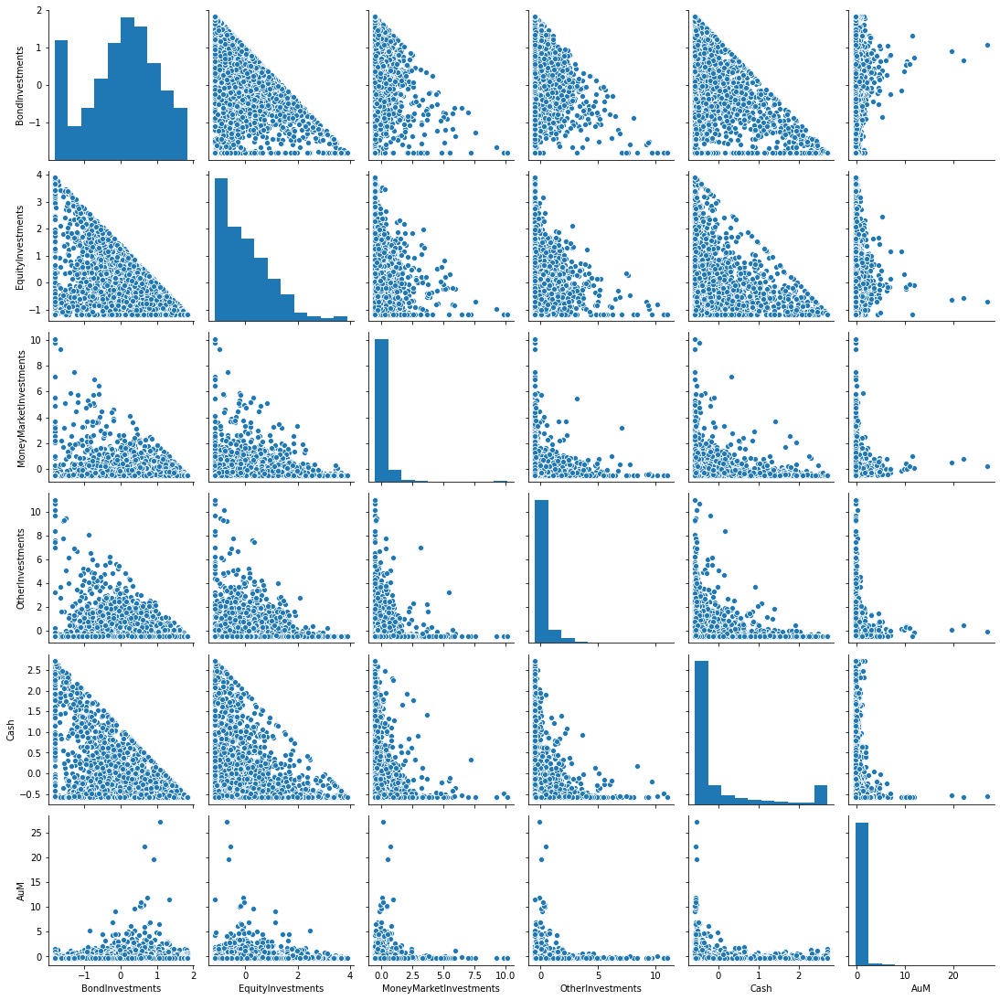

In [247]:
sns.pairplot(df_investment_scaled)

#### Missing Value

In [4]:
df[df["Prov"].isnull()]

,RiskPropension,PortfolioRisk,ClientInvestmentHorizon,PortfolioHorizon,ClientKnowledgeExperience,ClientPotentialIndex,IncomeHighLow,Sex,AuM,Age,...,InheritanceIndex,PanicMood,ClientDateStart,NoTrustInBanks,Prov,BondInvestments,EquityInvestments,MoneyMarketInvestments,OtherInvestments,Cash
7,0.337518,0.006087,3.750000,2.8892,0.523810,0.106135,0,1,124883,80,...,0.666763,0,2015,0,NaN,0.0000,0.0000,0.5587,0.3186,0.1228
54,0.357508,0.000000,13.634605,0.5000,0.714286,0.255215,0,1,179180,60,...,0.440650,0,2015,1,NaN,0.0000,0.0000,0.0000,0.0000,1.0000
77,0.643662,0.023923,15.958689,0.8774,0.428571,0.084663,0,1,102912,48,...,0.487845,0,2016,0,NaN,0.8264,0.0780,0.0012,0.0000,0.0944
142,0.268768,0.000000,6.450000,0.5000,0.428571,0.133129,0,0,20578,69,...,0.537193,0,2013,0,NaN,0.0000,0.0000,0.0000,0.0000,1.0000
145,0.304469,0.037943,21.755343,3.2207,0.428571,0.040491,0,1,16401,66,...,0.481931,0,2015,0,NaN,0.3967,0.4451,0.0848,0.0722,0.0013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4858,0.402307,0.032765,11.862388,1.0647,0.523810,0.069939,0,0,56446,54,...,0.458375,0,2016,0,NaN,0.7699,0.1016,0.0555,0.0000,0.0729
4862,0.369139,0.008782,6.050000,0.5000,0.428571,0.033129,0,0,19915,69,...,0.494104,0,2016,0,NaN,0.7779,0.0000,0.2209,0.0000,0.0012
4885,0.472527,0.091330,13.806069,1.0315,0.523810,0.172393,0,0,58183,53,...,0.529215,0,2016,1,NaN,0.8367,0.0709,0.0000,0.0000,0.0925
4904,0.392187,0.058081,29.899140,2.7716,0.809524,0.252761,0,1,231552,61,...,0.604623,0,2016,0,NaN,0.5198,0.3296,0.0014,0.0000,0.1492


In [6]:
df[df["Prov"].isna()]

,RiskPropension,PortfolioRisk,ClientInvestmentHorizon,PortfolioHorizon,ClientKnowledgeExperience,ClientPotentialIndex,IncomeHighLow,Sex,AuM,Age,...,InheritanceIndex,PanicMood,ClientDateStart,NoTrustInBanks,Prov,BondInvestments,EquityInvestments,MoneyMarketInvestments,OtherInvestments,Cash
7,0.337518,0.006087,3.750000,2.8892,0.523810,0.106135,0,1,124883,80,...,0.666763,0,2015,0,NaN,0.0000,0.0000,0.5587,0.3186,0.1228
54,0.357508,0.000000,13.634605,0.5000,0.714286,0.255215,0,1,179180,60,...,0.440650,0,2015,1,NaN,0.0000,0.0000,0.0000,0.0000,1.0000
77,0.643662,0.023923,15.958689,0.8774,0.428571,0.084663,0,1,102912,48,...,0.487845,0,2016,0,NaN,0.8264,0.0780,0.0012,0.0000,0.0944
142,0.268768,0.000000,6.450000,0.5000,0.428571,0.133129,0,0,20578,69,...,0.537193,0,2013,0,NaN,0.0000,0.0000,0.0000,0.0000,1.0000
145,0.304469,0.037943,21.755343,3.2207,0.428571,0.040491,0,1,16401,66,...,0.481931,0,2015,0,NaN,0.3967,0.4451,0.0848,0.0722,0.0013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4858,0.402307,0.032765,11.862388,1.0647,0.523810,0.069939,0,0,56446,54,...,0.458375,0,2016,0,NaN,0.7699,0.1016,0.0555,0.0000,0.0729
4862,0.369139,0.008782,6.050000,0.5000,0.428571,0.033129,0,0,19915,69,...,0.494104,0,2016,0,NaN,0.7779,0.0000,0.2209,0.0000,0.0012
4885,0.472527,0.091330,13.806069,1.0315,0.523810,0.172393,0,0,58183,53,...,0.529215,0,2016,1,NaN,0.8367,0.0709,0.0000,0.0000,0.0925
4904,0.392187,0.058081,29.899140,2.7716,0.809524,0.252761,0,1,231552,61,...,0.604623,0,2016,0,NaN,0.5198,0.3296,0.0014,0.0000,0.1492


### Clustering

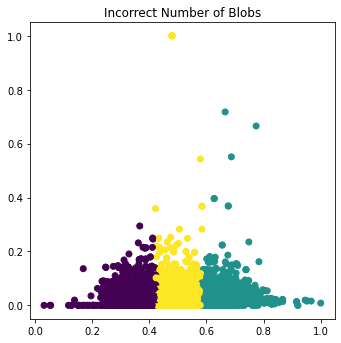

In [38]:
plt.figure(figsize=(12, 12))

n_samples = 1500
random_state = 170
X = df.iloc[: ,[0,1]]

# Incorrect number of clusters
y_pred = KMeans(n_clusters=3).fit_predict(X)

plt.subplot(221)
plt.scatter(X['RiskPropension'], X['PortfolioRisk'], c=y_pred)
plt.title("Incorrect Number of Blobs")



plt.show()

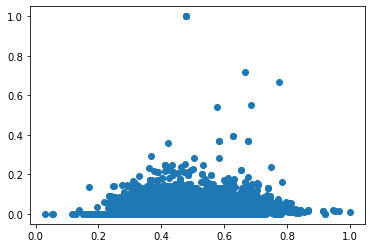

In [39]:
plt.scatter(X['RiskPropension'], X['PortfolioRisk'])

In [32]:
x=np.nan